# Reddit PhotoCritique Dataset

This notebooks presents an exploratory data analysis of the proposed dataset to extend the description provided in the [paper]().

## Imports & helper function

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
from PIL import Image

root_dataset = "/media/data-storage/datasets/reddit/" # Change this path to where the datasets has been downloaded
posts = pd.read_pickle(os.path.join(root_dataset, 'image_and_comments_reddit_dataset.pkl'))


def plot_16_images(posts):
    posts = posts[:16]
    fig = plt.figure(figsize=(26., 26.))
    grid = ImageGrid(fig, 111,  # similar to subplot(111)
                    nrows_ncols=(4, 4),  # creates 2x2 grid of axes
                    axes_pad=0.3,  # pad between axes in inch.
                    )
    for idx, (ax, (id,post)) in enumerate(zip(grid, posts.iterrows())):
        # Iterating over the grid returns the Axes.
        im = post.im_paths
        print(idx, im)
        for comment, s1, s2 in zip(post.first_level_comments_values, post.sentiment_1, post.sentiment_2):
            print(comment)
            print("Sentiment 1", s1)
            print("Sentiment 2", s2)
        image = Image.open(root_dataset + im)
        image.thumbnail(size=(300,300))
        ax.imshow(image)
        

In [3]:
posts

,id,url,title,score,num_comments,created_utc,author_id,upvote_ratio,gilded,total_awards_received,...,max_sentiment_2,emotion,max_emotion,person_in_image,ECS,CS,MS,FS,LS,max_shot_pred
0,5es9dz,https://i.redd.it/5f0xvodkppzx.jpg,"A Ballerina (ISO 100, F18, Shutter 1/160)",10,4,2016-11-25 06:44:58,feo3i,0.83,0,0,...,"[NEGATIVE, POSITIVE, NEGATIVE]","[{'anger': 0.008195677772164345, 'disgust': 0....","[neutral, joy, neutral]",True,3.926467e-01,7.379822e-04,5.698216e-01,0.000738,3.605575e-02,MS
1,5erhob,https://i.reddituploads.com/0ab7a7e5aeaa4918a0...,How might I edit this?,27,10,2016-11-25 03:24:57,81gbt,0.90,0,0,...,"[POSITIVE, POSITIVE, POSITIVE, POSITIVE, POSIT...","[{'anger': 0.00860016979277134, 'disgust': 0.0...","[neutral, neutral, neutral, joy, neutral]",False,2.928079e-04,2.262498e-04,4.215485e-04,0.001186,9.978729e-01,LS
2,5er2u1,http://imgur.com/nlAoqsH,I think this is the best picture i took. (2 mo...,4,2,2016-11-25 01:38:29,occly,0.75,0,0,...,[POSITIVE],"[{'anger': 0.02490752749145031, 'disgust': 0.4...",[disgust],False,2.204015e-02,6.389639e-05,9.777682e-01,0.000064,6.389639e-05,MS
3,5eqqj9,https://i.reddituploads.com/da7254257cb744eb8e...,My very first attempt at street photography. W...,0,2,2016-11-25 00:11:44,131z98,0.22,0,0,...,[NEGATIVE],"[{'anger': 0.009347893297672272, 'disgust': 0....",[neutral],False,1.714138e-08,1.714138e-08,1.072460e-06,0.999999,1.056862e-07,FS
4,5eqnkt,https://c2.staticflickr.com/6/5460/31052989892...,what could I improve? (please be honest/harsh),1,2,2016-11-24 23:51:24,x6m7v,0.57,0,0,...,"[NEGATIVE, NEGATIVE]","[{'anger': 0.01753615215420723, 'disgust': 0.1...","[neutral, neutral]",False,1.319836e-07,1.319836e-07,1.319836e-07,0.025790,9.742092e-01,LS
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73960,8xtoze,https://i.redd.it/d5rq6flfz6911.jpg,Do the reflections in the glasses look photore...,39,11,2018-07-10 21:53:58,a53th,0.88,0,0,...,"[NEGATIVE, NEGATIVE, NEGATIVE, POSITIVE, NEGAT...","[{'anger': 0.019886190071702003, 'disgust': 0....","[neutral, neutral, anger, neutral, neutral, ne...",True,1.939245e-05,1.532969e-01,1.672714e-04,0.000016,8.465001e-01,LS
73961,8xtlcg,https://i.redd.it/n5rqk1jbx6911.jpg,A beautiful day in Seattle. Thoughts on the [e...,46,9,2018-07-10 21:41:24,1n4j86kg,0.98,0,0,...,"[NEGATIVE, POSITIVE, POSITIVE, POSITIVE]","[{'anger': 0.02212751843035221, 'disgust': 0.7...","[disgust, joy, joy, joy]",False,1.424472e-10,1.424472e-10,1.424472e-10,0.000032,9.999683e-01,LS
73962,8xtflu,https://i.redd.it/zfiuk09mt6911.jpg,I like the pools of light in this image. Thoug...,7,3,2018-07-10 21:21:59,12klla,1.00,0,0,...,[NEGATIVE],"[{'anger': 0.0172461848706007, 'disgust': 0.00...",[sadness],False,2.367365e-11,2.367365e-11,2.367365e-11,0.999999,6.743534e-07,FS
73963,8xtf7m,https://i.redd.it/lapf0hxmt6911.jpg,[OC] What emotions do you read? [Style],3,3,2018-07-10 21:20:45,fvn1m,0.81,0,0,...,[NEGATIVE],"[{'anger': 0.017378371208906174, 'disgust': 0....",[disgust],False,2.965580e-03,9.928681e-01,1.349996e-03,0.000963,1.853398e-03,CS


## A first look into the dataset

From a random sample, we can see that comments describe the posted images regarding their photographic attributes. We use the selection of first level comments, meaning they are the comments that refer directly to the post and not to other comments (they are not a follow up comment or part of the body of a conversation). According to the subreddit rules:

"When commenting on an image, all top level comments should be an actual critique, whether positive, negative, or both. Blind praise such as ‘Great Shot’ or “Beautiful location, wish I was there” is not a critique nor is it helpful or constructive."

However, we must note that this rule might have been different in the past. Additionaly, we provide all the comments available in the post in the raw version of the dataset.

In [4]:
# TIP: Run this cell a bunch of times to get a feeling of how the critiqes look like :)

for idx, comments in enumerate(posts.sample(3).first_level_comments_values.values):
    for i, comment in enumerate(comments):
        print(f"{idx}.{i}.- {comment}")
        print("------------------------------------")
    print("====================================================")

0.0.- The sky looks nice, but the foreground is to dark in my opinion. 
------------------------------------
0.1.- Incredibly so.  That's not to say it looks bad (though the part by the tree is pretty rough), but it clearly isn't natural.  I also feel like the foreground is very much mismatched with the sky, it almost looks like you cut a beach sunset and put it over a suburban backyard.
------------------------------------
1.0.- it kinda draws too much attention from the horse, also it makes the horse abit dark. 
------------------------------------
1.1.- I think so.
------------------------------------
1.2.- I think the intent isn't obvious (horse is kinda dark but not a silhouette), so it's a little confusing. Cool depth of field though.
------------------------------------
2.0.- Do you want the truth or do you want false praise?
------------------------------------
2.1.- My biggest problem with this photo is that the focus seems to be set on the rim of the far bowl instead of the f

Critiques tend to be shorter when a photo is either really good or really bad, while they tend to be longer when there are varios aspects of the picture to comment on. Additionally, we notice that sometimes there are URLs and escaped characters. 

Okay, but show mw some photos!

0 2016/photocritique/images/2016-photocritique-submission_4yiuk7-image.jpeg
Nice shot, but the lower half of the subject needs more light. 
Sentiment 1 {'Negative': 0.04241279512643814, 'Neutral': 0.2420772910118103, 'Positive': 0.7155098915100098}
Sentiment 2 {'NEGATIVE': 0.0014634157996624708, 'POSITIVE': 0.9985365867614746}
Nice shot! I like that her face is hidden by her hair. I'd definitely raise the shadows though, the whole bottom of the photo is very dark. and maybe bump the blue saturation a bit so the sky pops 
Sentiment 1 {'Negative': 0.022465722635388374, 'Neutral': 0.17587412893772125, 'Positive': 0.8016601800918579}
Sentiment 2 {'NEGATIVE': 0.0015725529519841075, 'POSITIVE': 0.9984275102615356}
I thought I was in /r/bodyweightfitness for a moment and was wondering why everybody was making comments about the exposure, and not her posture.

Fantastic picture, and it's a bit difficult to capture due to the dynamic range. Try either masking the top half and playing around wit

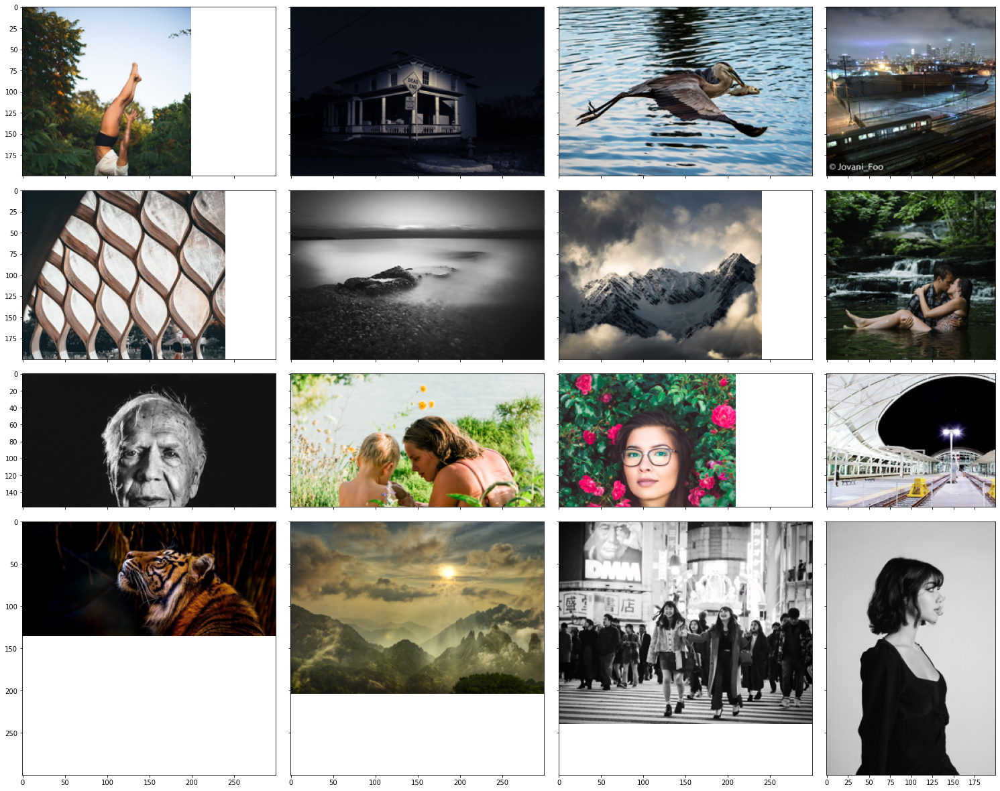

In [5]:
plot_16_images(posts[posts.top_post].sample(16))

The cell above showd a lot of information! First, the selected images are the ones considered top posts. A "top post" is defined as a post which has been either awarded (users on Reddit can "award" posts or comments. Such awards have a monetary equivalent) or has an score greater than the .75 percentile of posts with both comments and images (upvotes > 18).


**IMORTAN NOTE**: Some of the photos may not have been displayed completely, we recommend opening the images out of this plots. 

Additionaly, for each photo, we print each of the comments together with the sentiment prediction of two different predictors: 
- [Twitter-roBERTa for Sentiment Analysis](https://huggingface.co/cardiffnlp/twitter-roberta-base-sentiment): This is a roBERTa-base model trained on ~58M tweets and finetuned for sentiment analysis with the TweetEval benchmark.
- [SiEBERT](https://huggingface.co/siebert/sentiment-roberta-large-english): a fine-tuned checkpoint of RoBERTa-large evaluated on 15 data sets from diverse text sources.

We decide to stick to the first model to compute the sentiment scores, since the data distribution might be similar between the two social media sources and a qualitative overview of the predictions made us to prefer the first one.

Let's take a look at what information we have in the DataFrame:

In [6]:
posts.columns

Index(['id', 'url', 'title', 'score', 'num_comments', 'created_utc',
       'author_id', 'upvote_ratio', 'gilded', 'total_awards_received',
       'all_awardings', 'preview', 'num_crossposts', 'link_flair_text', 'year',
       'subreddit', 'first_level_comments_ids', 'first_level_comments_values',
       'PO_comment_id', 'PO_comment_values', 'awarded', 'top_post', 'nsfw',
       'im_paths', 'aspect_prediction', 'max_predicted_aspect', 'sentiment_1',
       'max_sentiment_1', 'sentiment_2', 'max_sentiment_2', 'emotion',
       'max_emotion', 'person_in_image', 'ECS', 'CS', 'MS', 'FS', 'LS',
       'max_shot_pred'],
      dtype='object')

## Description of each column

- `id`: Reddit submission id. There is one per post.
- `url`: Image url. We provide a script to download all images.
- `title`: Title of the submission.
- `score`: number of upvotes in the submission.
- `num_comments`: total number of comments in the submission, including automatic messages and replies to previous comments.
- `created_utc`: datetime of the submission creation
- `author_id`: Reddit user id
- `upvote_ratio`: Ratio between upvotes and total votes. Generally, the upvote ratio is pretty high. This could be due to the actual nature of the subreddit, which is pretty welcoming. Additionally, all posts are moderated so only approved posts get to the feed of the subreddit, reducing the number of posts that could be downvoted (spam, out of topic, etc). Additionally, all posts are automatically upvoted by the author, which produces that all posts without interaction have an upvote_ratio = 1.
- `gilded` and `total_awards_received`: Number of times a submission has been gilded and the number of awards received respectively. Awards are tokens of distinction that can be given to Redditors. Awards are different from trophies, in that they have a monetary cost to be granted. They have varying rewards, from nothing, to coins, and even Premium and Coins combined. Giving an Award, or "gilding", is a way to show appreciation for an exceptional contribution to Reddit. You can award someone by clicking on "Give Award" below their post or comment. This distinguishes it with an Award for all to see, and some even grant the honoree special bonus benefits. 
     More in: 
     - https://reddit.fandom.com/wiki/Awards
     - https://www.reddit.com/coins
   
- `all_awardings`: The actual awards that has been given, can be used to weight the awards by their cost or importance.
- `preview`: urls to the image of the submission with various resolutions.
- `num_crossposts`: Cross posts indicates how many times a post has been crossposted to other subreddits
- `link_flair_text`: Flait text shows the label given by the authors or mods. There's a new flair "Great Critique in Comments" introduced in mid-March'22. It will be useful in the future.
- `year`: year when the submission has been posted.
- `subreddit`: subreddit, in this case all values are `photocritique`. Not really useful, but all the pipeline is designed to be able to get posts from other subreddits. This dataset could be extended with other photography related subreddits.
- `first_level_comments_ids`: Ids of the top level comments in a submission
- `first_level_comments_values`: Values of the top level comments in a submission. These must be **critiques** according to the subreddit rules.
- `PO_comment_id`: Ids of the top level comments in a submission posted by the author of the submission. According to the rules of the subreddit _"When you post an image, before it is approved you are required to post a follow up comment with further information. The following information is required, not optional: What was your Intent for taking the photo? Why did you take this photo? What were you trying to show to the viewer? Are there areas you are struggling with? Be sure to ask specific questions about the photograph. What are you unhappy with? What you don’t like, and what you want help with? Be specific!"_
- `PO_comment_values`:  Values of the top level comments in a submission posted by the author of the submission.
- `awarded`: whether the submission has beend gilded or has received any award.
- `top_post`: whether the post is a "top post". We define a "top post" as a post which has been either awarded or has an score greater than the .75 percentile of posts with both comments and correct images (score > 18)
- `nsfw`: submissions self-reported as not safe for work.
- `im_paths`: path of the image according to the folder structure created by the downloading script.
- `aspect_prediction`: list of the aspect prediction for each of the comments, with the probabilities of each aspect. We use an [aspect prediction model](https://huggingface.co/daveni/aesthetic_attribute_classifier) trained on PCCD dataset to predict the photography aspect the comment is refering to.
- `max_predicted_aspect`: list of the aspect with the highest probability for each of the comments.
- `sentiment_1`: Sentiment prediction of the [Twitter-roBERTa for Sentiment Analysis](https://huggingface.co/cardiffnlp/twitter-roberta-base-sentiment) model. This is a roBERTa-base model trained on ~58M tweets and finetuned for sentiment analysis with the TweetEval benchmark.
- `max_sentiment_1`: list of the sentiment with the highest probability for each of the comments.
- `sentiment_2`: Sentiment prediction of the [SiEBERT](https://huggingface.co/siebert/sentiment-roberta-large-english) model, a fine-tuned checkpoint of RoBERTa-large evaluated on 15 data sets from diverse text sources.
- `max_sentiment_2`: list of the sentiment with the highest probability for each of the comments.
- `emotion`: Emotion prediction of the [Emotion English DistilRoBERTa-base](https://huggingface.co/j-hartmann/emotion-english-distilroberta-base) model. The model was trained on 6 diverse datasets and predicts Ekman's 6 basic emotions, plus a neutral class.
- `max_emotion`: list of the emotion with the highest probability for each of the comments.

## Time period

We have posts over a period of 13 years

In [7]:
print("Period of posts: ", posts.created_utc.sort_values().min(),"->", posts.created_utc.sort_values().max())

Period of posts:  2009-05-17 00:29:06 -> 2022-02-01 06:47:48


<AxesSubplot:>

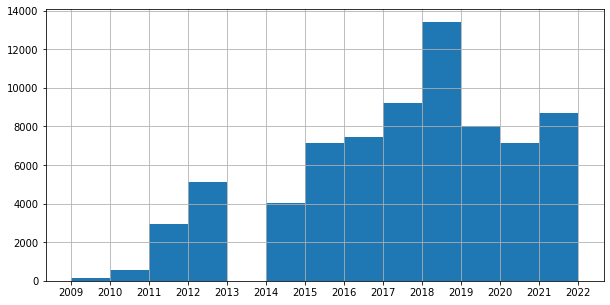

In [8]:
posts.year.sort_values().hist(bins=13, figsize=(10,5))

Observations:
- There is a gap in the year 2013 due to missing data in the service we used to gather the submissions.
- There was a peak of submission in 2018/2019

## Title

Some of them talks about the subject, other give more info about how the pic was made, or they ask for advice

In [9]:
for t in posts.title.sample(10).values:
    print(t)

Woodland Ombré⁠
Tried including flour in yesterday's dance photo shoot - how can I improve the lighting?
Feedback Appreciated
Picture of architecture in Poznań, Poland
I'm back again with another photo using my new external flash! Now please tell me, where did I go wrong here? Trying my best to not develop any bad habits.
A portrait taken in downtown Denver
Evening shades
[composition] [edit] Hello. What changes do you think would fit in perfectly for the right part? I feel like it’s a bad edit and needs changes.
does this look too photoshopped?
Any opinions on how to not make my skin so orange and make certain colors pop? Im new to Lightroom and its different for sure.. self portrait


In [10]:
# Stats number of words in title
posts.title.apply(lambda x: len(x.split())).describe()

count    73820.000000
mean        10.140247
std          7.857186
min          1.000000
25%          5.000000
50%          8.000000
75%         13.000000
max         64.000000
Name: title, dtype: float64

There is an average of 10 words in the title, while the median is 8.

## Comments

In [11]:
# Stats number of comments per post
posts.first_level_comments_values.apply(lambda x: len(x)).describe()

count    73820.00000
mean         2.97735
std          3.70015
min          1.00000
25%          1.00000
50%          2.00000
75%          3.00000
max        126.00000
Name: first_level_comments_values, dtype: float64

In [12]:
# Total of critiques
posts.first_level_comments_values.apply(lambda x: len(x)).sum() 

219788

In [13]:
posts.num_comments.sum()

536653

<AxesSubplot:ylabel='Frequency'>

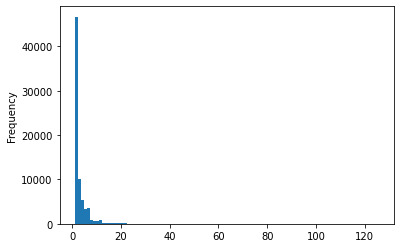

In [14]:
posts.first_level_comments_values.apply(lambda x: len(x)).plot(kind='hist', bins=100)

There is an average of 2.9 critiques per submissions, while the median is 2. Most of the posts have few critiques, while there are some of them with a lot of activity. 
There's a total of 219790 critiques in the whole dataset, while there are 536657 comments. This indicates that approximately half of the comments in the dataset are replies.

In [15]:
posts.first_level_comments_values.apply(lambda x: [len(comment.split()) for comment in x]).explode().apply(int).describe() #TODO There's something weird going on, I have to cast again to int to produce the stats

count    219788.000000
mean         49.133720
std          55.505585
min           1.000000
25%          16.000000
50%          33.000000
75%          61.000000
max        1286.000000
Name: first_level_comments_values, dtype: float64

<AxesSubplot:ylabel='Frequency'>

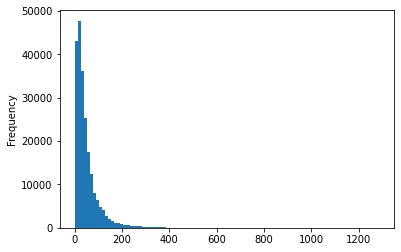

In [16]:
posts.first_level_comments_values.apply(lambda x: [len(comment.split()) for comment in x]).explode().apply(int).plot(kind='hist', bins=100)

The first level comments have an average of ~49 words, with a median of 33. As with the number of comments, the number of words per comment distribution also have a long tail.

## Aesthetic aspects

Let's take a look to the predictions of our model trained on PCCD to predict the photograhy attribute the comment is refering to. This model predicts one of the following aspects: `composition`, `general_impression`, `color_lighting`, `subject_of_photo`, `use_of_camera`, `focus`, and `depth_of_field`.

composition           55054
general_impression    46430
color_lighting        40097
subject_of_photo      31516
use_of_camera         26409
focus                 10897
depth_of_field         9385
Name: aspect_prediction, dtype: int64


<AxesSubplot:>

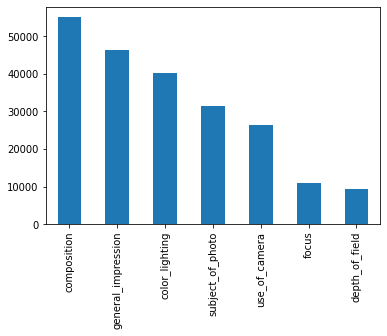

In [17]:
print(posts.aspect_prediction.apply(lambda x: [max(elem, key= lambda key: elem[key]) for elem in x]).explode().value_counts())
posts.aspect_prediction.apply(lambda x: [max(elem, key= lambda key: elem[key]) for elem in x]).explode().value_counts().plot(kind='bar')

Observations:
- Unbalanced distribution of the different aspects. This could be due to biases in the model, the difficulty to predict some of the classes, or simply that there are less comments focusing on some of the aspects.
- Most of the comments are related to the composition, general impression or color and lightning.

Let's take a look at each aspect:

In [18]:
for idx, post in posts.sample(3).iterrows():
    for i, (comment, s1, s2) in enumerate(zip(post.first_level_comments_values, post.aspect_prediction, post.max_predicted_aspect)):
        print(f"{idx}.{i}.- {comment}")
        # print("Aspects", s1)
        print("Max predicted aspect: ", s2)
        print()

3660.0.- Props for taking the time to reprocess older images; a fresh perspective is a powerful thing in landscape photography. 

Your recent edit is very solid, and it's not far off from how I would have done it. The biggest improvements were recovering detail and color in the sky, boosting saturation throughout, and straightening out the horizon. It's now a perfectly competent photograph. 

That said, some things could still stand to be improved. In particular, it's a little flat – midtones dominate the image without any real highlights and shadows to speak of. It's bordering on the "overcooked HDR" look. We strive for a wide dynamic range, and the D810 can pull unholy amounts of detail out of the harshest parts of an image, but you still have to let highlights be highlights and shadows be shadows. 

I also find the processing of the sky to be a little unnatural. The Lightroom gradient filter is a useful tool, but it's a little heavy-handed, and you can easily end up with weird tones

There's still room for improvement. 

## Sentiment & Emotion predictions

Positive    105727
Neutral      69008
Negative     45053
Name: sentiment_1, dtype: int64


<AxesSubplot:>

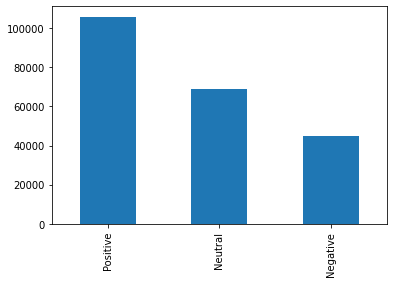

In [19]:
print(posts.sentiment_1.apply(lambda x: [max(elem, key= lambda key: elem[key]) for elem in x]).explode().value_counts())
posts.sentiment_1.apply(lambda x: [max(elem, key= lambda key: elem[key]) for elem in x]).explode().value_counts().plot(kind='bar')


POSITIVE    143584
NEGATIVE     76204
Name: sentiment_2, dtype: int64


<AxesSubplot:>

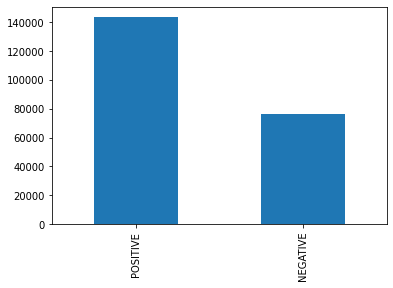

In [20]:
print(posts.sentiment_2.apply(lambda x: [max(elem, key= lambda key: elem[key]) for elem in x]).explode().value_counts())
posts.sentiment_2.apply(lambda x: [max(elem, key= lambda key: elem[key]) for elem in x]).explode().value_counts().plot(kind='bar')

neutral     127465
joy          46098
disgust      17730
surprise     12145
sadness       7034
fear          5794
anger         3522
Name: emotion, dtype: int64


<AxesSubplot:>

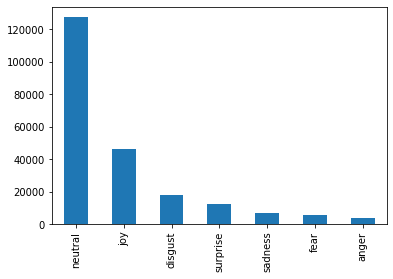

In [21]:
print(posts.emotion.apply(lambda x: [max(elem, key= lambda key: elem[key]) for elem in x]).explode().value_counts())
posts.emotion.apply(lambda x: [max(elem, key= lambda key: elem[key]) for elem in x]).explode().value_counts().plot(kind='bar')

Obervations:
- Both sentiment predictions are umbalanced towards the positive sentiment. This could be due to the general ambient in the subreddit, which tries to provide constructive feedback or remark some good aspects of a photography when critisizing it.
- Most of the predicted emotions are neutral, which makes sense in the case of a critique. 
- We decide to stick to the first model to compute the sentiment scores, since the data distribution might be similar between the two social media sources and a qualitative overview of the predictions made us to prefer the first one.

## Sentiment score

Let's look at the computed sentiment score distribution.

In [24]:
from aestheval.data.datasets import Reddit
import torch
import pandas as pd
SPLITS = ('train', 'validation', 'test')

reddit_dataset = [Reddit(split, dataset_path = "/media/data-storage/datasets/reddit/", load_images=False) for split in SPLITS]
dataset = torch.utils.data.ConcatDataset(reddit_dataset)

<AxesSubplot:ylabel='Frequency'>

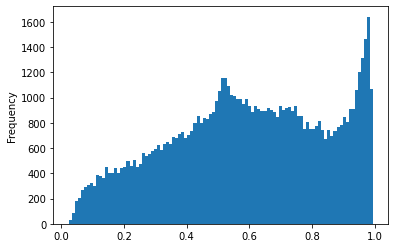

In [25]:

pd.Series([data['mean_score'] for _, data in dataset]).plot(kind='hist', bins=100)



<AxesSubplot:ylabel='Frequency'>

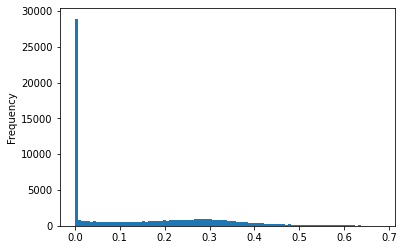

In [26]:
pd.Series([data['stdev_score'] for _, data in dataset]).plot(kind='hist', bins=100)


The score distribution is slighlty skewed to the positive scores. Let's see some examples of good/bad images according to this score. 

In [55]:
scores, paths, comments, aspects = zip(*sorted([(data['mean_score'], data['im_paths'], data['first_level_comments_values'], data['aspect_prediction']) for _, data in dataset], key=lambda x: x[0]))
posts = pd.DataFrame({'path': paths,
                'comments': comments,
                'scores': scores,
                'aspects': aspects})


In [56]:
posts['max_aspects'] = posts.aspects.apply(lambda x: [max(elem, key= lambda key: elem[key]) for elem in x])


In [57]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
from PIL import Image
import os

root_dataset = "/media/data-storage/datasets/reddit/"

def plot_16_images(posts):
    posts = posts[:16]
    fig = plt.figure(figsize=(26., 26.))
    grid = ImageGrid(fig, 111,  # similar to subplot(111)
                    nrows_ncols=(4, 4),  # creates 2x2 grid of axes
                    axes_pad=0.3,  # pad between axes in inch.
                    )
    for idx, (ax, (id,post)) in enumerate(zip(grid, posts.iterrows())):
        # Iterating over the grid returns the Axes.
        im = post.path
        print(idx, im)
        for comment in post.comments:
            print(comment)
        print("Sentiment score", post.scores)
        image = Image.open(os.path.join(root_dataset, im))
        image.thumbnail(size=(300,300))
        # ax.set_xlabel(post.scores)
        # ax.set_title(post.comments)
        ax.imshow(image)

### Bad images

0 2012/photocritique/images/2012-photocritique-submission_13bo1y-image.jpeg
the sky is fucked up and ugly
Sentiment score 0.03139056824147701
1 2018/photocritique/images/2018-photocritique-submission_9m47aj-image.jpeg
The quality of this photo is not the best, is this cropped or zoomed in on the iPhone?
Sentiment score 0.040580779779702425
2 2018/photocritique/images/2018-photocritique-submission_93fajr-image.jpeg
This is beyond amateur-ish. This is doodoo. I don't want to see your face around here again tbh...
Sentiment score 0.02600029343739152
3 2012/photocritique/images/2012-photocritique-submission_145mt9-image.jpeg
The blur is ridiculous and the colors are just annoying. I'm not saying that because of instagram hate, I'm saying it because that is just how it is on this photo.

I tried.
Sentiment score 0.043439420871436596
4 2015/photocritique/images/2015-photocritique-submission_3cg9og-image.jpeg
The Shadows are way too harsh. I'd wait for better light.
Sentiment score 0.04619300

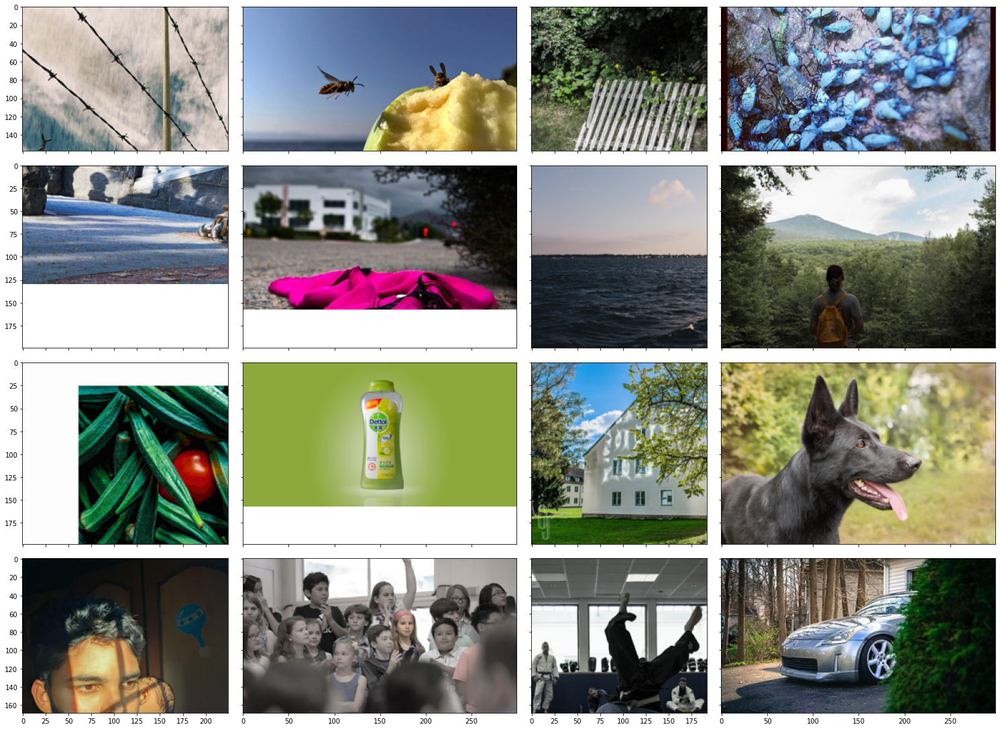

In [42]:
# Keep running this cell to see a sample out of the worst 200 images according to the sentiment score
plot_16_images(posts.iloc[:200].sample(16)) 

### Middle images

Images in the middle of the sentiment score distribution

0 2018/photocritique/images/2018-photocritique-submission_a5o3s1-image.jpeg
I like that you chose to use so much vertical space, but I do feel that we need more at the bottom. The exposure, lighting, and posing are well done here—I just would like to have the hair not blocking her other eye. Also, you have a lone straight strand of long grass to the left of her head. I would brush that out. 
It's overly green. The background lacks detail and is quite colorless. If you eliminated the green cast and introduced some artificial color, perhaps use a solid color fill layer in the pink family with a soft light blend mode and then just painted it over her as a spotlight effect it would really up up the magical feel and add some pretty light and still appear natural.
I think a tighter crop would work, cut off the space to the left of the tree. I get what you're going for with all the green but its a tad bit too much. Model looks good, nice pose and costume.
Looks really good!! The only thing I 

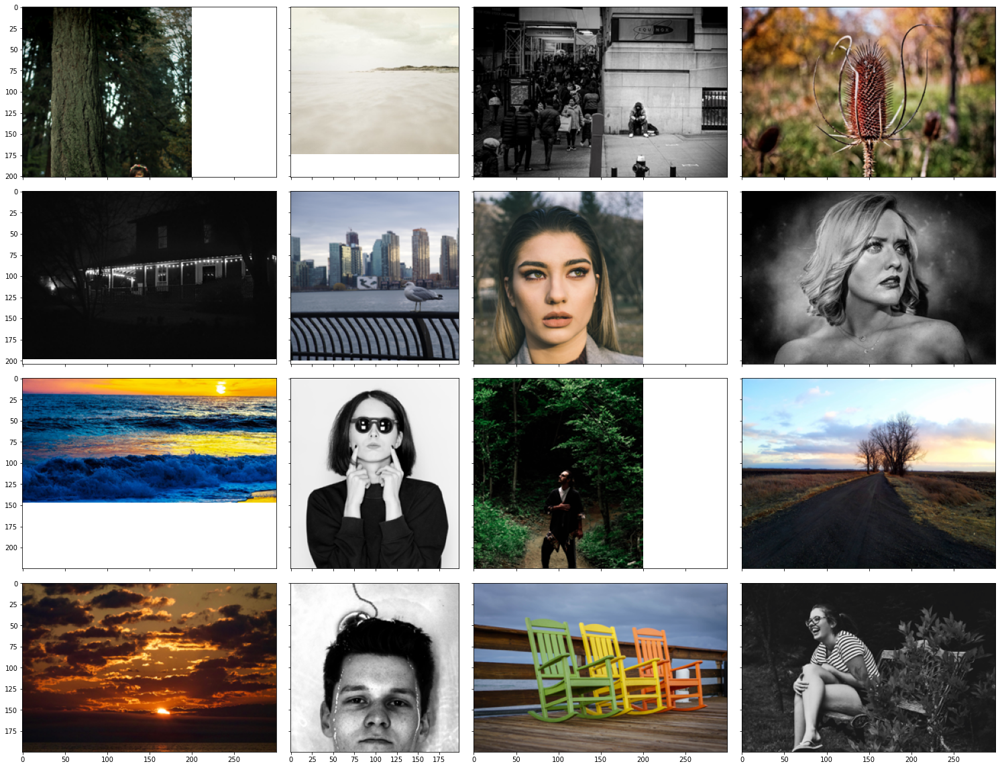

In [25]:
# Keep running this cell to see a sample out of the middle 200 images according to the sentiment score
mid = int(posts.shape[0]/2)
plot_16_images(posts.iloc[mid-100:mid+100].sample(16))

### Good Images

0 2014/photocritique/images/2014-photocritique-submission_2kf91l-image.jpeg
Great colors, very nice.
Sentiment score 0.9917998528108001
1 2021/photocritique/images/2021-photocritique-submission_og9etk-image.jpeg
Mate this pic looks awesome, keep posting your stuff !
Sentiment score 0.9905953267589211
2 2012/photocritique/images/2012-photocritique-submission_15phws-image.jpeg
Welcome!!

Not bad for a first try.  I strongly recommend you look at the work from Ben Canales.  He has some fantastic night shots and even won national geographic best picture of the year in 2011 I believe. 

http://www.thestartrail.com/#!__tutorials




***It's really hard to recommend his website when it plays music but he really has great photos.


Good luck!

I really like this one!

http://www.flickr.com/photos/westredington/8327644493/in/photostream/
Sentiment score 0.9903274483513087
3 2020/photocritique/images/2020-photocritique-submission_ikhfmw-image.jpeg
A very good first try!  I like the composition a

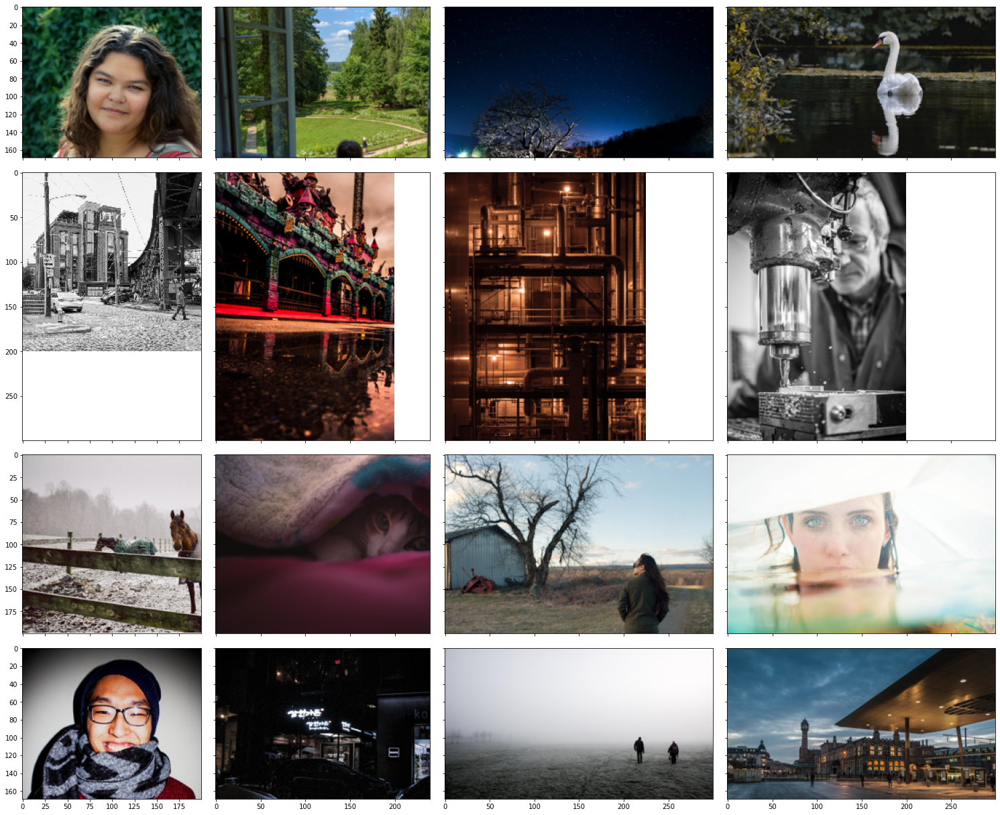

In [26]:
# Keep running this cell to see a sample out of the best 200 images according to the sentiment score
plot_16_images(posts.iloc[-200:].sample(16))

## Sentiment score per photographic aspect

In [64]:
posts = posts.explode(['comments', 'max_aspects'])

def plot_4_images(posts):
    posts = posts[:4]
    fig = plt.figure(figsize=(26., 15.))
    grid = ImageGrid(fig, 111,  # similar to subplot(111)
                    nrows_ncols=(1, 4),  # creates 2x2 grid of axes
                    axes_pad=0.3,  # pad between axes in inch.
                    )
    for idx, (ax, (id,post)) in enumerate(zip(grid, posts.iterrows())):
        # Iterating over the grid returns the Axes.
        im = post.path
        print(idx, im)
        print(post.comments)
        print("Sentiment score", post.scores)
        image = Image.open(os.path.join(root_dataset, im))
        image.thumbnail(size=(300,300))
        ax.imshow(image)

### Composition

####  Bad comosition

0 2017/photocritique/images/2017-photocritique-submission_70tahr-image.jpeg
I dislike the fact that the bridge is so cut off, it feels like it's intruding into the frame rather than belonging there.
Sentiment score 0.07415496883913875
1 2018/photocritique/images/2018-photocritique-submission_9t0z4z-image.jpeg
I don't think the composition is strong enough, the subject are the vents but the background distracts from them. I would also say the subject isn't compelling enough.
Sentiment score 0.06778149539604783
2 2021/photocritique/images/2021-photocritique-submission_nskj8q-image.jpeg
The fact you almost clipped his shoes, and almost clipped the top of the bridge is messing with my head. A bit wider shot would have been better in my opinion
Sentiment score 0.0663694185204804
3 2018/photocritique/images/2018-photocritique-submission_8wit5m-image.jpeg
Doesn’t work. You have 4 subjects which makes it unbalanced. Rice farmer is facing the wrong way though. 

You should have done only the fa

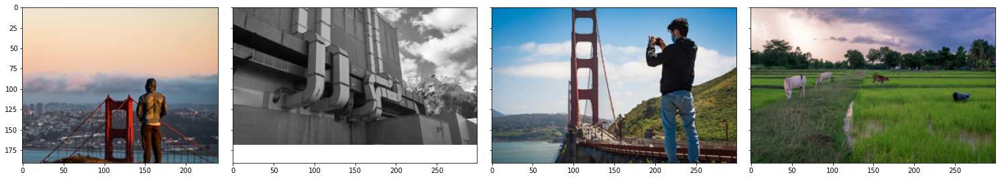

In [68]:
plot_4_images(posts[posts.max_aspects == 'composition'].iloc[:200].sample(4))


#### Middle composition

0 2012/photocritique/images/2012-photocritique-submission_ou091-image.jpeg
I for 1 think its above and beyond your standard portrait. If it was just 1 picture I feel it would have been bland and not emotionally provoking. But by taking it to the next step by combining two photos for a portrait and not having them line up "correctly" gives you a feel of the persons personality, or the mystery of it.
Sentiment score 0.6108917008969001
1 2019/photocritique/images/2019-photocritique-submission_ckvvfe-image.jpeg
I like this style. I like the composition. But I dont like pictures taken in harse sunlight. That is my biggest critique.
Sentiment score 0.6097185735901197
2 2016/photocritique/images/2016-photocritique-submission_56ymzr-image.jpeg
An angle that would frame his face in the mirror on the door would have made for an interesting shot.
Sentiment score 0.6115175932645798
3 2021/photocritique/images/2021-photocritique-submission_om41a3-image.jpeg
Crop the photograph in. Make this picture

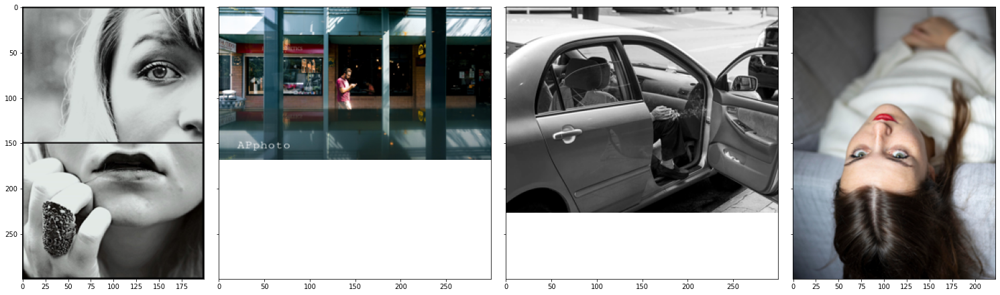

In [69]:
mid = int(posts[posts.max_aspects == 'composition'].shape[0]/2)
plot_4_images(posts[posts.max_aspects == 'composition'].iloc[mid-100:mid+100].sample(4))

#### Good composition

0 2011/photocritique/images/2011-photocritique-submission_j7sbw-image.jpeg
I like this a lot.  Interesting perspective, almost abstract, clean.  DO you have any shot with a wider angle?  It would be nice to see a broader view too.
Sentiment score 0.9840030753985047
1 2017/photocritique/images/2017-photocritique-submission_5ofq69-image.jpeg
I like it.  Definitely like this better than the first angle.  It is kinda of fun in black and white took.
Sentiment score 0.9838545434176922
2 2016/photocritique/images/2016-photocritique-submission_58qo1p-image.jpeg
That is glorious!!!  Great expression and light.  Have you experimented with cropping off about 1/6th from the top?  This would bring a little bit more focus back to him and not have his head RIGHT in the middle.
Sentiment score 0.980799812823534
3 2012/photocritique/images/2012-photocritique-submission_toxzg-image.jpeg
I think it's stunning. Love the angle.
Sentiment score 0.9859248977154493


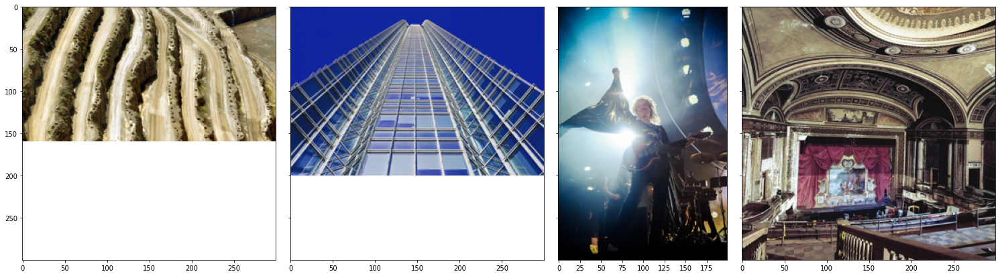

In [71]:
plot_4_images(posts[posts.max_aspects == 'composition'].iloc[-200:].sample(4))

### General Impression

#### Bad

0 2012/photocritique/images/2012-photocritique-submission_xjxvy-image.jpeg
Not a very good picture, simply because it's a boring subject.
Sentiment score 0.03953116666525602
1 2014/photocritique/images/2014-photocritique-submission_28eip6-image.jpeg
I hate to be negative and I don't want to discourage you, but that's a truly awful photo. The worst of the many problems I see is that nothing in the photo is in focus. Be more careful about where you're focusing and use a faster shutter speed to freeze the action. Just taking those two steps would make the photo way better.
Sentiment score 0.05941675789654255
2 2016/photocritique/images/2016-photocritique-submission_4a5dhm-image.jpeg
I think It's a well lit photo of messy hair that is probably meant to tell some kind of story but I can't figure it out so maybe it's a little too vague, and it's not sharp at all which for a picture like this of fine detail (hair) really kills it for me. What were the settings?
Sentiment score 0.0795078161172

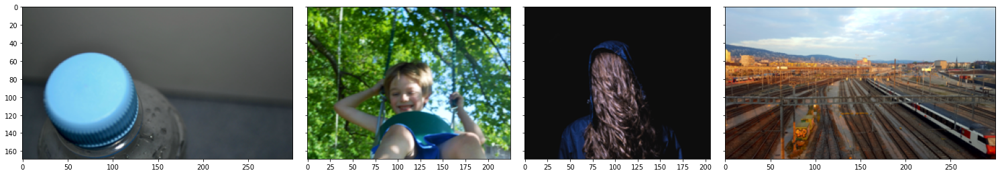

In [72]:
plot_4_images(posts[posts.max_aspects == 'general_impression'].iloc[:200].sample(4))

#### Middle

0 2019/photocritique/images/2019-photocritique-submission_ajshwr-image.jpeg
You have a beautiful cat!

However, although your use of light and all the technical aspects of this photo are good. Including the crop etc. There's nothing interesting happening here. It feels like a snapshot of a cat, and nothing more. 

I understand that it's your pet, and you won't be taking her out in the snow just to get a "cool" photo. But maybe find a better backdrop in your house. Or get some lights behind her for a more interesting bokeh. 

Never the less, good work. (:
Sentiment score 0.7228178381919861
1 2018/photocritique/images/2018-photocritique-submission_8m4eq4-image.jpeg
I like the photo! But she needs to do something about those wrinkles on the dress. Really distracting. 
Sentiment score 0.7231844761845423
2 2012/photocritique/images/2012-photocritique-submission_10uyts-image.jpeg
I really like it, and I think it's a solid shot. I do think the warm cast is too intense and that this image woul

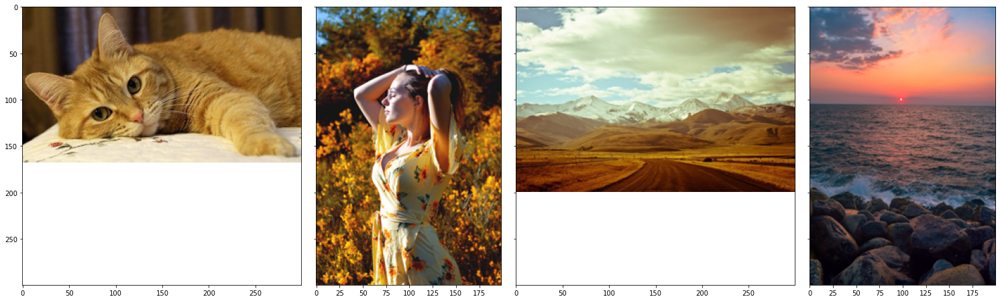

In [73]:
mid = int(posts[posts.max_aspects == 'general_impression'].shape[0]/2)
plot_4_images(posts[posts.max_aspects == 'general_impression'].iloc[mid-100:mid+100].sample(4))

#### Good

0 2016/photocritique/images/2016-photocritique-submission_4u9gw8-image.jpeg
This is a really nice portrait. It's original, without it being over the top. Keep it up. 
Sentiment score 0.9879801363684237
1 2021/photocritique/images/2021-photocritique-submission_ku7pb7-image.jpeg
I actually really like this photo! It is a little under exposed, but you nailed the horizon line.
Sentiment score 0.9882693435065448
2 2018/photocritique/images/2018-photocritique-submission_8zbg5e-image.jpeg
Of course it's a great shot.  Keep it up!
Sentiment score 0.9907072773203254
3 2018/photocritique/images/2018-photocritique-submission_81fk8t-image.jpeg
Hello! I love this picture! her position, it's detail and the expression; excellent! My only suggestion is perhaps to cut the photo around to give her a leading and a dramatic role.
Sentiment score 0.9888159977272153


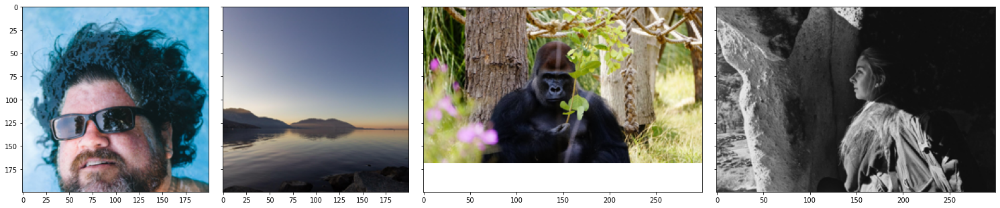

In [76]:
plot_4_images(posts[posts.max_aspects == 'general_impression'].iloc[-200:].sample(4))

## Conclusion

- The computed sentiment scores are apparently able to discern between good and bad photos in a number of different photographic styles. 
- More polarized comments (really good or really bad) tend to be shorter and less informative than those more neutral comments, which highlight the good and bad parts of an image.
- The predicted aspects are usually accurate, but it is true that some of the comments refer to different aspects at the same time and the model have trouble to deal with them.